In [157]:
import os
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [158]:
import warnings
warnings.filterwarnings('ignore')

In [159]:
data=pd.read_csv("census_income_data.csv")

In [160]:
# As we can see we have 32561 rows and 15 columns in the dataset

print('Total rows in the data',data.shape[0])
print('Total columns in the data',data.shape[1])

Total rows in the data 32561
Total columns in the data 15


In [161]:
data.describe()

,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [162]:
income_data=data.copy()
income_data1=data.copy()

In [163]:
income_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [164]:
income_data.dtypes

age                int64
workclass         object
fnlwgt             int64
education         object
education.num      int64
marital.status    object
occupation        object
relationship      object
race              object
sex               object
capital.gain       int64
capital.loss       int64
hours.per.week     int64
native.country    object
income            object
dtype: object

In [165]:
income_data.isna().sum()                       # null values are not present / no missing values in dataset

age               0
workclass         0
fnlwgt            0
education         0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

In [166]:
# import ydata_profiling

# from pandas_profiling import ProfileReport

# prof=ProfileReport(income_data)

# prof.to_file(output_file='cen.html')

# #  all my output will be save in this html file.
# #  report of dataframe in an interactive way.


# 'captain.gain, captain.loss' are not important features.

In [167]:
income_data.drop(['fnlwgt'],axis=1,inplace=True)

In [168]:
# The updated rows and columns we have in our dataset is here after dropping the column 'fnlwgt'

print('Now we have',income_data.shape[0], 'rows and ', income_data.shape[1], 'columns in our dataset')

Now we have 32561 rows and  14 columns in our dataset


In [169]:
income_data.head()

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [170]:
# Let's rename our column names

income_data.rename(columns={'age':'Age', 
                            'workclass':'Work-Class', 
                            'education':'Education', 
                            'education.num':'Education-Num', 
                            'marital.status':'Marital_Status', 
                            'occupation':'Occupation', 
                            'relationship': 'Relationship', 
                            'sex':'Sex', 
                            'race':'Race',
                            'capital.gain':'Capital_gain',
                            'capital.loss':'Capital_loss',
                            'hours.per.week':'Hours_per_week', 
                            'native.country':'Native_Country',
                            'income':'Income'
                           },
                  inplace = True)
income_data

,Age,Work-Class,Education,Education-Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_Country,Income
0,90,?,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,Some-college,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,United-States,<=50K
32557,27,Private,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32558,40,Private,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32559,58,Private,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K


In [171]:
income_data['Work-Class'].value_counts()

Private             22696
Self-emp-not-inc     2541
Local-gov            2093
?                    1836
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: Work-Class, dtype: int64

In [172]:
income_data['Marital_Status'].value_counts()

Married-civ-spouse       14976
Never-married            10683
Divorced                  4443
Separated                 1025
Widowed                    993
Married-spouse-absent      418
Married-AF-spouse           23
Name: Marital_Status, dtype: int64

In [173]:
income_data['Occupation'].value_counts()

Prof-specialty       4140
Craft-repair         4099
Exec-managerial      4066
Adm-clerical         3770
Sales                3650
Other-service        3295
Machine-op-inspct    2002
?                    1843
Transport-moving     1597
Handlers-cleaners    1370
Farming-fishing       994
Tech-support          928
Protective-serv       649
Priv-house-serv       149
Armed-Forces            9
Name: Occupation, dtype: int64

In [174]:
income_data['Relationship'].value_counts()

Husband           13193
Not-in-family      8305
Own-child          5068
Unmarried          3446
Wife               1568
Other-relative      981
Name: Relationship, dtype: int64

In [175]:
income_data['Race'].value_counts()

White                 27816
Black                  3124
Asian-Pac-Islander     1039
Amer-Indian-Eskimo      311
Other                   271
Name: Race, dtype: int64

In [176]:
income_data['Sex'].value_counts()

Male      21790
Female    10771
Name: Sex, dtype: int64

In [177]:
income_data['Native_Country'].value_counts()

United-States                 29170
Mexico                          643
?                               583
Philippines                     198
Germany                         137
Canada                          121
Puerto-Rico                     114
El-Salvador                     106
India                           100
Cuba                             95
England                          90
Jamaica                          81
South                            80
China                            75
Italy                            73
Dominican-Republic               70
Vietnam                          67
Guatemala                        64
Japan                            62
Poland                           60
Columbia                         59
Taiwan                           51
Haiti                            44
Iran                             43
Portugal                         37
Nicaragua                        34
Peru                             31
Greece                      

In [178]:
income_data['Income'].value_counts()

<=50K    24720
>50K      7841
Name: Income, dtype: int64

In [179]:
#  assigning "?" to nan values and filling them by most frequent values using mode([0])

In [180]:
income_data['Work-Class']=income_data['Work-Class'].replace('?',np.nan)

In [181]:
income_data['Occupation']=income_data['Occupation'].replace('?',np.nan)

In [182]:
income_data['Native_country']=income_data['Native_Country'].replace('?',np.nan)

In [183]:
income_data.head()

,Age,Work-Class,Education,Education-Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_Country,Income,Native_country
0,90,NaN,HS-grad,9,Widowed,NaN,Not-in-family,White,Female,0,4356,40,United-States,<=50K,United-States
1,82,Private,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K,United-States
2,66,NaN,Some-college,10,Widowed,NaN,Unmarried,Black,Female,0,4356,40,United-States,<=50K,United-States
3,54,Private,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K,United-States
4,41,Private,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K,United-States


In [184]:
income_data.isna().sum()

Age                  0
Work-Class        1836
Education            0
Education-Num        0
Marital_Status       0
Occupation        1843
Relationship         0
Race                 0
Sex                  0
Capital_gain         0
Capital_loss         0
Hours_per_week       0
Native_Country       0
Income               0
Native_country     583
dtype: int64

In [185]:
# Corr() function enables you to see correaltion between your respective column or dataset
income_data.corr()


,Age,Education-Num,Capital_gain,Capital_loss,Hours_per_week
Age,1.000000,0.036527,0.077674,0.057775,0.068756
Education-Num,0.036527,1.000000,0.122630,0.079923,0.148123
Capital_gain,0.077674,0.122630,1.000000,-0.031615,0.078409
Capital_loss,0.057775,0.079923,-0.031615,1.000000,0.054256
Hours_per_week,0.068756,0.148123,0.078409,0.054256,1.000000


In [186]:
#  filling null values with most frequent values 

In [187]:
income_data['Work-Class']=income_data['Work-Class'].fillna(income_data['Work-Class']).mode()[0]

In [188]:
income_data['Occupation']=income_data['Occupation'].fillna(income_data['Occupation']).mode()[0]

In [189]:
income_data['Native_Country']=income_data['Native_Country'].fillna(income_data['Native_Country']).mode()[0]

In [190]:
income_data.head()

,Age,Work-Class,Education,Education-Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_Country,Income,Native_country
0,90,Private,HS-grad,9,Widowed,Prof-specialty,Not-in-family,White,Female,0,4356,40,United-States,<=50K,United-States
1,82,Private,HS-grad,9,Widowed,Prof-specialty,Not-in-family,White,Female,0,4356,18,United-States,<=50K,United-States
2,66,Private,Some-college,10,Widowed,Prof-specialty,Unmarried,Black,Female,0,4356,40,United-States,<=50K,United-States
3,54,Private,7th-8th,4,Divorced,Prof-specialty,Unmarried,White,Female,0,3900,40,United-States,<=50K,United-States
4,41,Private,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K,United-States


In [191]:
# To check the unique categories of the variable
# replacing the values inside columns
income_data['Education']=income_data['Education'].replace({'HS-grad':'High School',        
                                    'Some-college':'Degree incomplete',     
                                     'Bachelors':'Graduate',        
                                      'Masters':'Post Graduate',          
                                      'Assoc-voc':'Vocational Degree',        
                                      '11th':'Intermediate 1st year',             
                                       'Assoc-acdm':'Under Graduate',       
                                        '10th':'Secondary',              
                                        '7th-8th':'Middle',           
                                        'Prof-school':'Professional degree',       
                                        '9th':'Secondary',               
                                        '12th':'Senior Secondary',              
                                        'Doctorate':'Medical Degree',         
                                        '5th-6th':'Middle',           
                                        '1st-4th':'Primary',           
                                        'Preschool':'Pre Primary'})


In [192]:
income_data['Work-Class']=income_data['Work-Class'].replace({'Private':'Private Sector',             
                                            'Self-emp-not-inc':'Local Business',     
                                            'Local-gov':'Public sector employee',                              
                                            'State-gov':'State Govt Employee',            
                                            'Self-emp-inc':'Entrepreneur',         
                                            'Federal-gov':'Central Govt employee',           
                                             'Without-pay':'Unpaid employee',            
                                             'Never-worked':'Fresher'})


In [193]:
income_data['Occupation']=income_data['Occupation'].replace({'Prof-specialty':'Professional in specific area',       
                    'Craft-repair':'Craft repair & maintenance',         
                    'Exec-managerial':'Executive Management',      
                    'Adm-clerical':'Administrative Clerk',         
                    'Sales':'Sales Person',
                    'Other-service':'Service provider',        
                    'Machine-op-inspct':'Machine operator & inspector',                        
                    'Transport-moving':'Material moving machine operators',     
                    'Handlers-cleaners':'Cleaners',    
                    'Farming-fishing':'Fishing & Farming',       
                    'Tech-support':'Technical',          
                    'Protective-serv':'Protective services',       
                    'Priv-house-serv':'Private Households'}) 

In [194]:
income_data.head()

,Age,Work-Class,Education,Education-Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_Country,Income,Native_country
0,90,Private Sector,High School,9,Widowed,Professional in specific area,Not-in-family,White,Female,0,4356,40,United-States,<=50K,United-States
1,82,Private Sector,High School,9,Widowed,Professional in specific area,Not-in-family,White,Female,0,4356,18,United-States,<=50K,United-States
2,66,Private Sector,Degree incomplete,10,Widowed,Professional in specific area,Unmarried,Black,Female,0,4356,40,United-States,<=50K,United-States
3,54,Private Sector,Middle,4,Divorced,Professional in specific area,Unmarried,White,Female,0,3900,40,United-States,<=50K,United-States
4,41,Private Sector,Degree incomplete,10,Separated,Professional in specific area,Own-child,White,Female,0,3900,40,United-States,<=50K,United-States


In [195]:
income_data.groupby('Sex')['Occupation'].value_counts().sort_values(ascending=False)

Sex     Occupation                   
Male    Professional in specific area    21790
Female  Professional in specific area    10771
Name: Occupation, dtype: int64

In [196]:
# Have a look at this output, here we can clearly see most of the married people are involved in occupation

income_data.groupby('Marital_Status')['Occupation'].value_counts().sort_values(ascending=False)

Marital_Status         Occupation                   
Married-civ-spouse     Professional in specific area    14976
Never-married          Professional in specific area    10683
Divorced               Professional in specific area     4443
Separated              Professional in specific area     1025
Widowed                Professional in specific area      993
Married-spouse-absent  Professional in specific area      418
Married-AF-spouse      Professional in specific area       23
Name: Occupation, dtype: int64

In [197]:
# we have only private sector

income_data.groupby('Work-Class')['Occupation'].value_counts().sort_values(ascending=False)

Work-Class      Occupation                   
Private Sector  Professional in specific area    32561
Name: Occupation, dtype: int64

In [198]:
income_data.groupby(['Education','Work-Class'])['Occupation'].count().head(10)

#  count of occupation of people on the basis of their education & then by workclass

Education              Work-Class    
Degree incomplete      Private Sector     7291
Graduate               Private Sector     5355
High School            Private Sector    10501
Intermediate 1st year  Private Sector     1175
Medical Degree         Private Sector      413
Middle                 Private Sector      979
Post Graduate          Private Sector     1723
Pre Primary            Private Sector       51
Primary                Private Sector      168
Professional degree    Private Sector      576
Name: Occupation, dtype: int64

In [199]:
income_data.groupby(['Occupation'])['Hours_per_week'].count().head()

#  working number of hours on the basis of workclass & then on occupation

Occupation
Professional in specific area    32561
Name: Hours_per_week, dtype: int64

In [200]:
income_data.groupby(['Race'])['Income'].value_counts()

#  earning of people on the basis of race.
#  Countries like US have race issues. So this factor impacts income of a person.

Race                Income
Amer-Indian-Eskimo  <=50K       275
                    >50K         36
Asian-Pac-Islander  <=50K       763
                    >50K        276
Black               <=50K      2737
                    >50K        387
Other               <=50K       246
                    >50K         25
White               <=50K     20699
                    >50K       7117
Name: Income, dtype: int64

In [201]:
income_data.groupby('Age')['Income'].value_counts()

Age  Income
17   <=50K     395
18   <=50K     550
19   <=50K     710
     >50K        2
20   <=50K     753
              ... 
86   <=50K       1
87   <=50K       1
88   <=50K       3
90   <=50K      35
     >50K        8
Name: Income, Length: 138, dtype: int64

#  Analysis report
32561 rows & 15 columns are present

One column has dropped that is identifier.

No null values are present in the data set

'?' is present in 3 colums 'workplace','occupation' & 'native.country'

we have repalced '?' with np.nan as we do not have a correct value.

Now, if data is missed at random - we can do either removing or imputation.

Here we have impute missed values using most frequent value i.e using 'mode'

Renaming few columns like education, occupation, native country .


Analyse the data using value_counts() & groupby method.

'Race', 'age' are still factors influence on income in few coutries like US. So we have done analysis on that too.


#  working on outliers

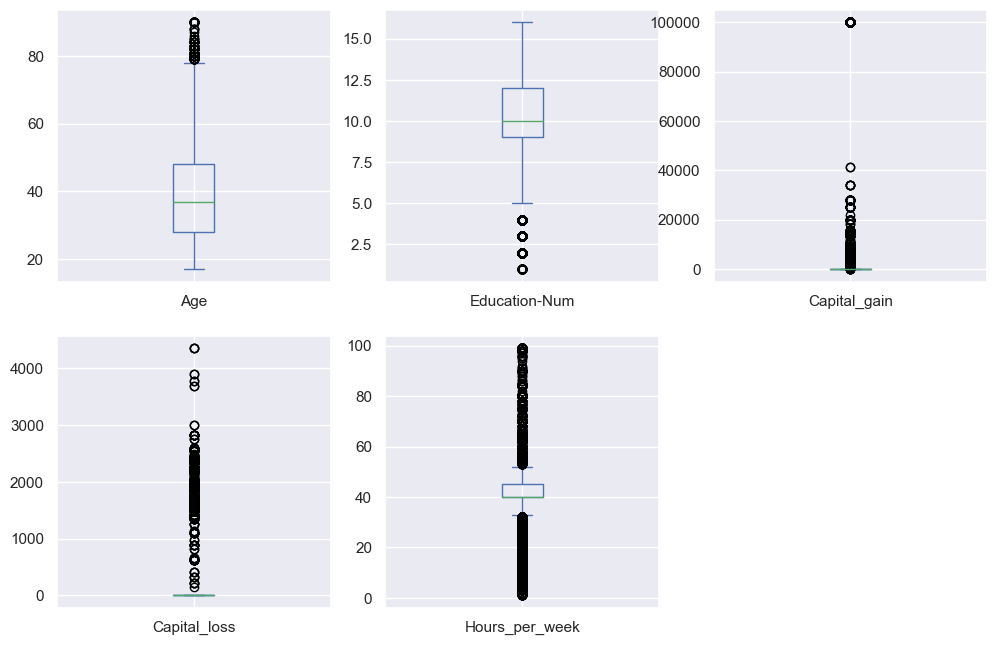

In [202]:
income_data.plot(kind='box',figsize=(12,12),layout=(3,3),sharex=False,subplots=True);


In [203]:
int_column=['Age','Education-Num','Capital_gain','Capital_loss','Hours_per_week']

In [204]:
income_data = income_data[(income_data['Education-Num'] <= 16) | (income_data['Education-Num'] >= 4)]
income_data = income_data[income_data['Capital_gain'] <= 50000]
income_data = income_data[income_data['Capital_loss'] <= 3000]
income_data = income_data[(income_data['Hours_per_week'] <= 80) | (income_data['Hours_per_week'] >= 20)]


In [205]:
income_data

,Age,Work-Class,Education,Education-Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_Country,Income,Native_country
11,38,Private Sector,Professional degree,15,Never-married,Professional in specific area,Not-in-family,White,Male,0,2824,45,United-States,>50K,United-States
12,52,Private Sector,Graduate,13,Widowed,Professional in specific area,Not-in-family,White,Female,0,2824,20,United-States,>50K,United-States
13,32,Private Sector,Post Graduate,14,Separated,Professional in specific area,Not-in-family,White,Male,0,2824,55,United-States,>50K,United-States
14,51,Private Sector,Medical Degree,16,Never-married,Professional in specific area,Not-in-family,White,Male,0,2824,40,United-States,>50K,United-States
15,46,Private Sector,Professional degree,15,Divorced,Professional in specific area,Not-in-family,White,Male,0,2824,40,United-States,>50K,United-States
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private Sector,Degree incomplete,10,Never-married,Professional in specific area,Not-in-family,White,Male,0,0,40,United-States,<=50K,United-States
32557,27,Private Sector,Under Graduate,12,Married-civ-spouse,Professional in specific area,Wife,White,Female,0,0,38,United-States,<=50K,United-States
32558,40,Private Sector,High School,9,Married-civ-spouse,Professional in specific area,Husband,White,Male,0,0,40,United-States,>50K,United-States
32559,58,Private Sector,High School,9,Widowed,Professional in specific area,Unmarried,White,Female,0,0,40,United-States,<=50K,United-States


In [206]:
income_data[int_column].describe()

,Age,Education-Num,Capital_gain,Capital_loss,Hours_per_week
count,32391.000000,32391.000000,32391.000000,32391.000000,32391.000000
mean,38.537032,10.066840,592.432558,86.472106,40.392331
std,13.635303,2.565152,2560.670851,398.051110,12.330000
min,17.000000,1.000000,0.000000,0.000000,1.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000
75%,48.000000,12.000000,0.000000,0.000000,45.000000
max,90.000000,16.000000,41310.000000,2824.000000,99.000000


In [207]:
# 	age	fnlwgt	education.num	capital.gain	capital.loss	hours.per.week

# count	32561.000000	3.256100e+04	32561.000000	32561.000000	32561.000000	32561.000000
# mean	38.581647	1.897784e+05	10.080679	1077.648844	87.303830	40.437456

# std	13.640433	1.055500e+05	2.572720	7385.292085	402.960219	12.347429

# min	17.000000	1.228500e+04	1.000000	0.000000	0.000000	1.000000

# 25%	28.000000	1.178270e+05	9.000000	0.000000	0.000000	40.000000

# 50%	37.000000	1.783560e+05	10.000000	0.000000	0.000000	40.000000

# 75%	48.000000	2.370510e+05	12.000000	0.000000	0.000000	45.000000

# max	90.000000	1.484705e+06	16.000000	99999.000000	4356.000000	99.000000

In [208]:
income_data.corr()

,Age,Education-Num,Capital_gain,Capital_loss,Hours_per_week
Age,1.000000,0.033308,0.116704,0.054703,0.068124
Education-Num,0.033308,1.000000,0.145773,0.083286,0.144031
Capital_gain,0.116704,0.145773,1.000000,-0.050262,0.082949
Capital_loss,0.054703,0.083286,-0.050262,1.000000,0.056866
Hours_per_week,0.068124,0.144031,0.082949,0.056866,1.000000


In [209]:
# Age	Education-Num	Capital_gain	Capital_loss	Hours_per_week

# Age	1.000000	0.036527	0.077674	0.057775	0.068756

# Education-Num	0.036527	1.000000	0.122630	0.079923	0.148123

# Capital_gain	0.077674	0.122630	1.000000	-0.031615	0.078409

# Capital_loss	0.057775	0.079923	-0.031615	1.000000	0.054256

# Hours_per_week	0.068756	0.148123	0.078409	0.054256	1.000000

In [210]:
income_data['Income'] = income_data['Income'].replace('<=50K', 0)
income_data['Income'] = income_data['Income'].replace('>50K', 1)
income_data.head()

,Age,Work-Class,Education,Education-Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_Country,Income,Native_country
11,38,Private Sector,Professional degree,15,Never-married,Professional in specific area,Not-in-family,White,Male,0,2824,45,United-States,1,United-States
12,52,Private Sector,Graduate,13,Widowed,Professional in specific area,Not-in-family,White,Female,0,2824,20,United-States,1,United-States
13,32,Private Sector,Post Graduate,14,Separated,Professional in specific area,Not-in-family,White,Male,0,2824,55,United-States,1,United-States
14,51,Private Sector,Medical Degree,16,Never-married,Professional in specific area,Not-in-family,White,Male,0,2824,40,United-States,1,United-States
15,46,Private Sector,Professional degree,15,Divorced,Professional in specific area,Not-in-family,White,Male,0,2824,40,United-States,1,United-States


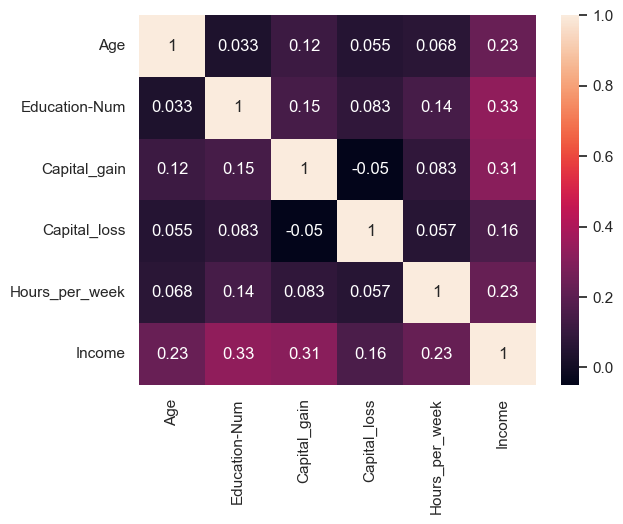

In [211]:
sns.heatmap(income_data.corr(),annot=True);

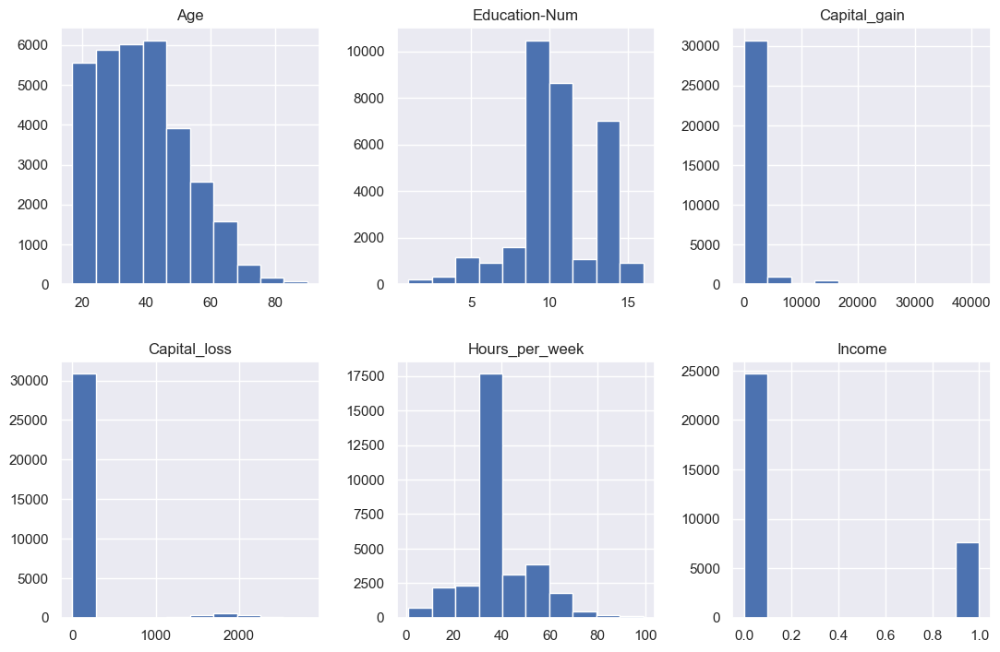

In [212]:
income_data.hist(figsize=(13,13),layout=(3,3),sharex=False);

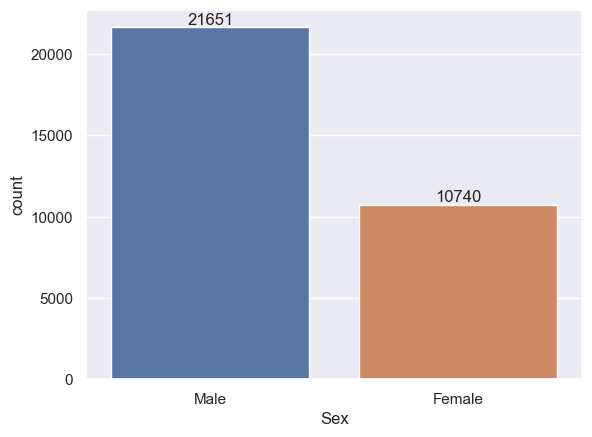

In [213]:
# Let's viualize count of Male and Female in our dataset
sns.set(font_scale=1)
w = sns.countplot(data = income_data, x = "Sex")
for bars in w.containers:
    w.bar_label(bars)


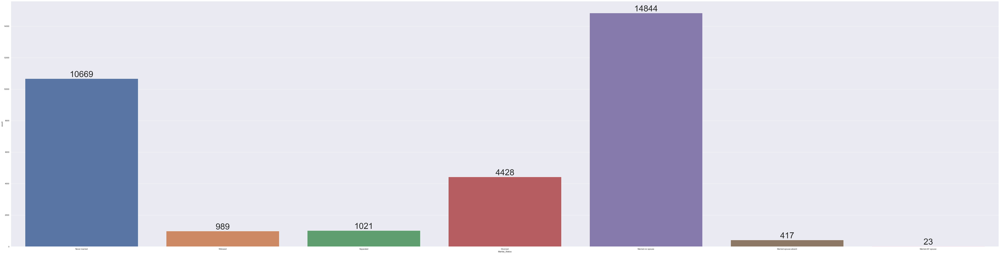

In [214]:
# Let's viualize count of Marital Status in our dataset
fig, ax = plt.subplots(figsize=(100, 25))
sns.set(font_scale=4)
w = sns.countplot(data = income_data, x = "Marital_Status")
for bars in w.containers:
    w.bar_label(bars)


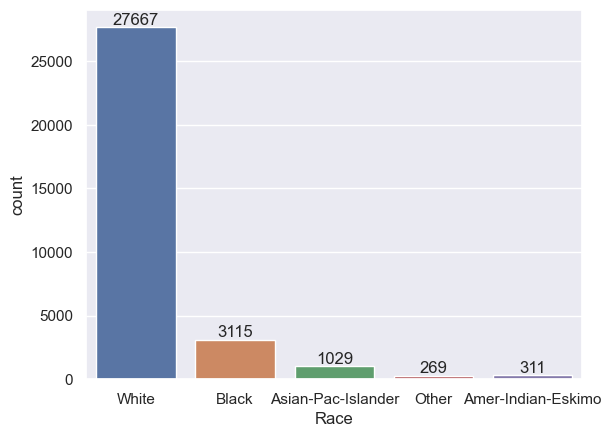

In [215]:
# Let's viualize count of Race in our dataset
sns.set(font_scale=1)
w = sns.countplot(data = income_data, x = "Race")
for bars in w.containers:
    w.bar_label(bars)


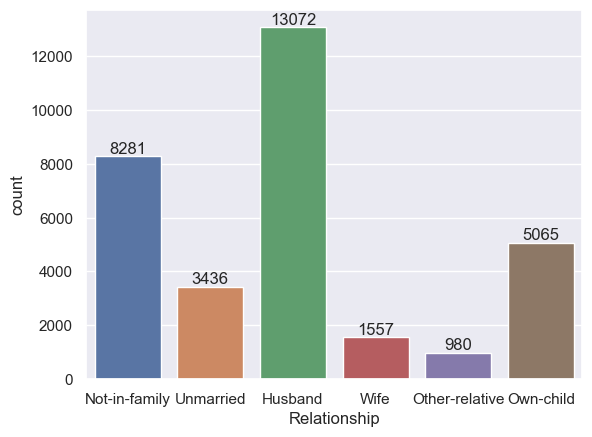

In [216]:
# Let's viualize count of Relationship in our dataset
sns.set(font_scale=1)
w = sns.countplot(data = income_data, x = "Relationship")
for bars in w.containers:
    w.bar_label(bars)


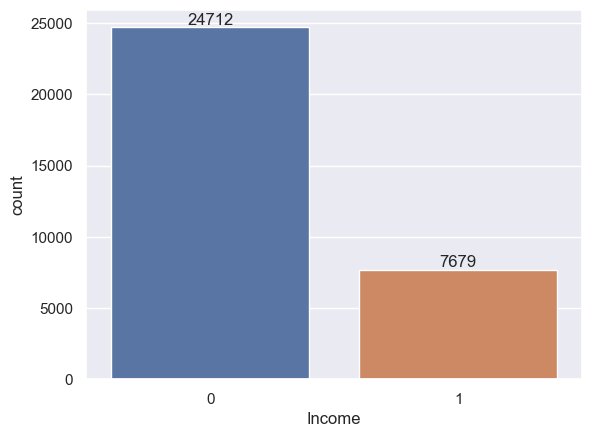

In [217]:
# Let's viualize how many people are earning more than or less than 50k
sns.set(font_scale=1)
w = sns.countplot(data = income_data, x = "Income")
for bars in w.containers:
    w.bar_label(bars)


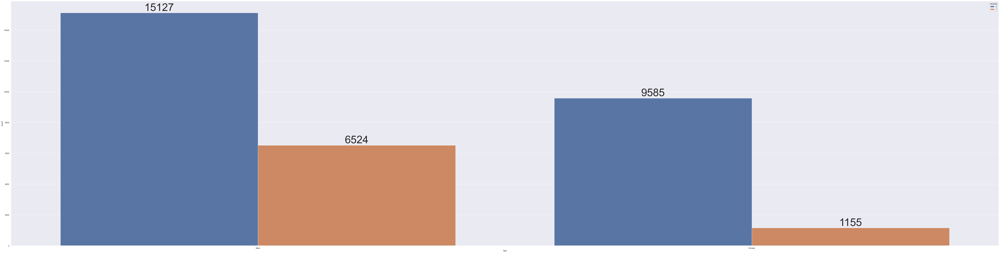

In [218]:
# let's see minimum and maximum number of people earning in terms of 'Male' &'Female'

fig, ax = plt.subplots(figsize=(100, 25))
sns.countplot(data = income_data, x = 'Sex', hue = 'Income')
sns.set(font_scale=5)
for bars in ax.containers:
    ax.bar_label(bars)

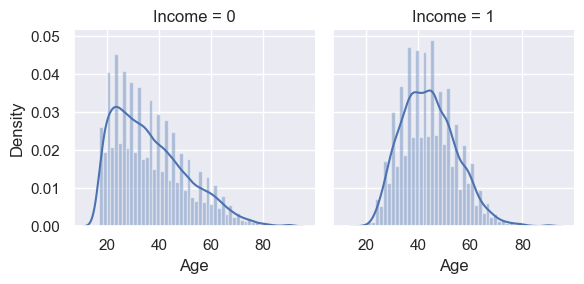

In [227]:
# Explore age vs income

g = sns.FacetGrid(income_data, col='Income')
sns.set(font_scale=1)
g = g.map(sns.distplot, "Age")
plt.show()

# ?less than ,equal to 50 in '0'  &greater than in '1'.

<Axes: xlabel='Education-Num', ylabel='count'>

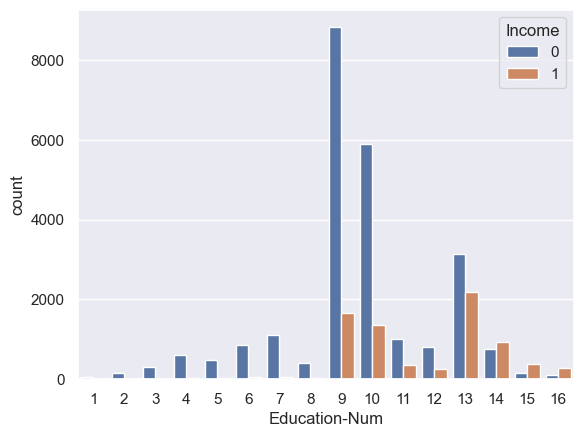

In [220]:
# Inferences

# Explore education.num vs income class

sns.countplot(x=income_data['Education-Num'],hue=income_data['Income'])


Text(0.5, 1.0, 'Race vs Income')

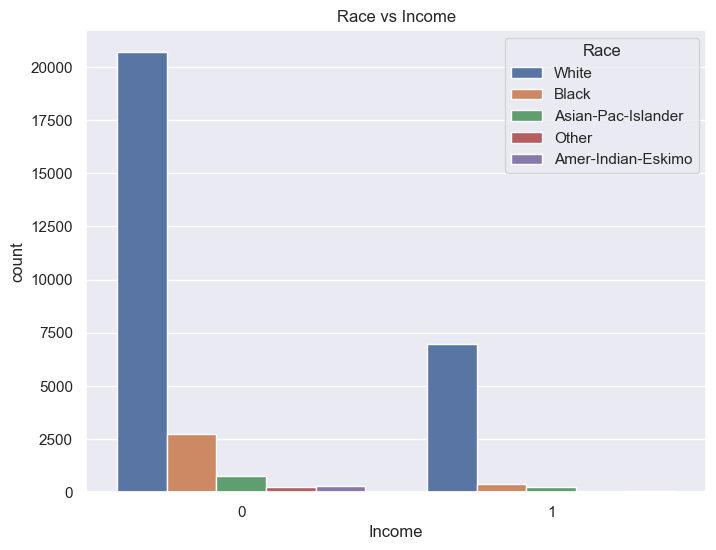

In [221]:
# Inferences

# check the income level of different races
plt.figure(figsize=(8,6))
ax = sns.countplot(x=income_data['Income'], hue=income_data['Race'])
ax.set_title('Race vs Income')

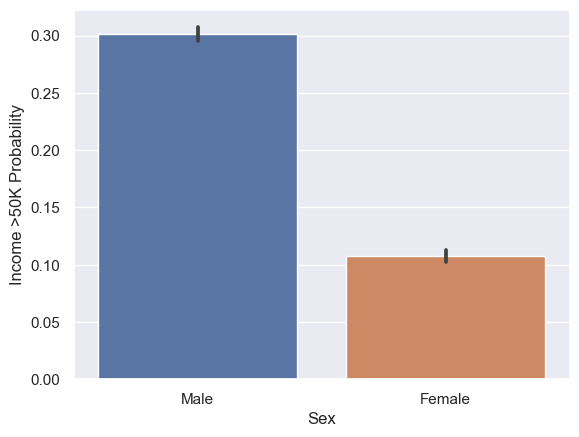

In [222]:
#Explore sex vs income

g = sns.barplot(x="Sex",y="Income",data=income_data)
g = g.set_ylabel("Income >50K Probability")
plt.show()

    

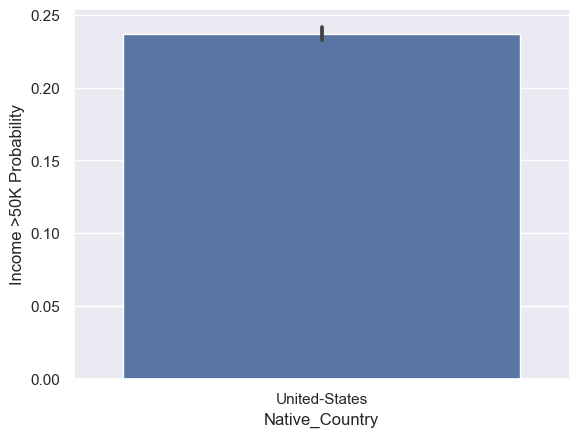

In [223]:
# inference

g = sns.barplot(x="Native_Country",y="Income",data=income_data)
g = g.set_ylabel("Income >50K Probability")
plt.show()


In [224]:
# let's see minimum and maximum number of people earning in terms of education.
fig, ax = plt.subplots(figsize=(180, 50))
sns.histplot(data = income_data, x = 'Education', hue = 'Income')
sns.set(font_scale=8)
for bars in ax.containers:
    ax.bar_label(bars)


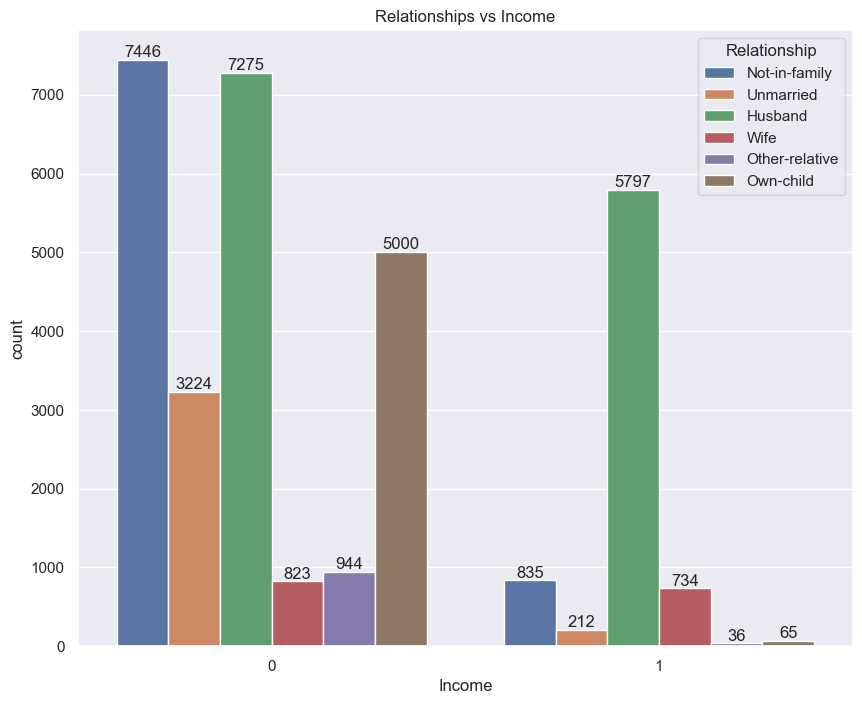

In [228]:
# Check the income level of different Relationships
fig, ax = plt.subplots(figsize=(10, 8))
ax1 = sns.countplot(x=income_data['Income'], hue=income_data['Relationship'])
sns.set(font_scale=1)

ax1.set_title('Relationships vs Income')

for bars in ax.containers:
    ax.bar_label(bars)

In [226]:
#Doing statistical chisquare test to check association between Gender and income

#Hypothesis

#Null hypothesis Ho = There is no association between Gender and income

#Vs Alternative hypothesis H1 = There is association



In [78]:
census_data = pd.crosstab(income_data.Sex ,income_data.Income)
print("Following is contigency table")
census_data


Following is contigency table


Income,0,1
Sex,,
Female,9585,1155
Male,15127,6524


In [79]:
a1 = [9585,1155]
a2 = [15127,6524]
a3 = np.array([a1,a2])
from scipy import stats
stats.chi2_contingency(a3)
chi2_stat, p_val, dof, ex = stats.chi2_contingency(a3)
print("Chisquare test value is : ",chi2_stat)
print("\nDegree of freedom is : ",dof)
print("\nP-Value is : ",p_val)
print("\nExpected observation contiggency table\n")
print(ex)

Chisquare test value is :  1489.4165268756374

Degree of freedom is :  1

P-Value is :  0.0

Expected observation contiggency table

[[ 8193.84643883  2546.15356117]
 [16518.15356117  5132.84643883]]


In [80]:
# Alternate method

In [81]:
chi,p_val,dof,observed = stats.chi2_contingency(a3)

In [82]:
observed

array([[ 8193.84643883,  2546.15356117],
       [16518.15356117,  5132.84643883]])

In [83]:
if p_val>=0.05:
    print('Ho: is True (Income is independent of Gender)')
else:
    print('Ha: is True (Income is dependent of Gender)')

Ha: is True (Income is dependent of Gender)


In [84]:
p_val

0.0

In [85]:
#Since from above result ,

#Chisquare value is greater than p-value so we reject H0 and conclude that there is association between Gender and income.
#Since from above result ,

#Chisquare value is greater than p-value so we reject H0 and conclude that there is association between Gender and income.



Now we checking second objective, whether it is positive or negative association.

To check Positive or negative association, We use concepts as follow,

Gender has two level a1 = Female and a2 = Male. Income has two level b1 = '<=50K' and b2 = '>50k'

then following is formula is used to find association

for positive association (a1b1) > ((a1)(b1))/N

for negative association (a1b1) < ((a1)(b1))/N

where,

(a1b1) = Number of Female earning less than <=50K (a1) = Total number of Female observation (b1) = Total number of observation earning less than <=50K N = Total number of observations



In [86]:
x,y,z = a3[0][1]+a3[0][0],a3[1][1]+a3[1][0],a3[0][0]+a3[1][0]+a3[0][1]+a3[1][1]
print('Number of female earning less than <=50K is ',a3[0][0])
print('Number of female observation is ',a3[0][1]+a3[0][0])
print('Number of male ',a3[1][1]+a3[1][0])
print('Total observation is ',a3[0][0]+a3[1][0]+a3[0][1]+a3[1][1])
print("Value of evaluation metric is ",((x*y)/z))

Number of female earning less than <=50K is  9585
Number of female observation is  10740
Number of male  21651
Total observation is  32391
Value of evaluation metric is  7178.899694359544


In [87]:
#From above result, (a1b1) > (a1)(b1)/N hence it is positive association.

#Hence our second objective is also completed.

#Now we will check third objective that is, does man earning more monery than female

#Following is gender , incomewise percent distribution



Skewness:  1.2365309113342688
Kurtosis:  -0.4710203925391263


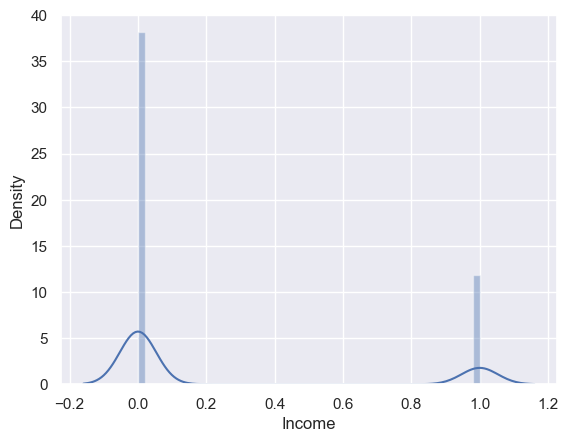

In [88]:
sns.distplot(income_data['Income'])
print('Skewness: ',income_data['Income'].skew())
print('Kurtosis: ',income_data['Income'].kurt())
plt.show()

In [89]:
#USING PIE TO SEE THE DISTRUBUTION OF THE DATA
px.pie(income_data, values='Education-Num', names='Education', title='Percentage of Education', 
      color_discrete_sequence = px.colors.qualitative.T10)

In [90]:
#using scatter plot

fig = px.scatter(income_data, x="Capital_gain", y="Hours_per_week",color="Sex",
                title="scatter plot capital-gain and Hours-per-week as per gender")
fig.show()


In [91]:
fig = px.pie(income_data, values='Hours_per_week', names='Sex', color_discrete_sequence=px.colors.sequential.RdBu,
            title='Pie chart showing Gender & and hours per week')
fig.update_traces(textposition='inside',textinfo='percent+label')
fig.show()


In [92]:
#Doing statistical chisquare test to check association between Gender and income

#Hypothesis

#Null hypothesis Ho = There is no association between Gender and income

#Vs Alternative hypothesis H1 = There is association




# MODEL BUILDING


In [93]:
X= income_data.drop(['Income'],axis=1)
y=income_data['Income']

# FEATURE SCALING


In [94]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [95]:
# df1=income_data.copy()
df1=income_data.apply(LabelEncoder().fit_transform)
df1.head()

,Age,Work-Class,Education,Education-Num,Marital_Status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_Country,Income,Native_country
11,21,0,9,14,4,0,1,4,1,0,86,44,0,1,38
12,35,0,1,12,6,0,1,4,0,0,86,19,0,1,38
13,15,0,6,13,5,0,1,4,1,0,86,54,0,1,38
14,34,0,4,15,4,0,1,4,1,0,86,39,0,1,38
15,29,0,9,14,0,0,1,4,1,0,86,39,0,1,38


In [96]:
ss= StandardScaler().fit(df1.drop('Income', axis=1))


In [97]:
X= ss.transform(df1.drop('Income', axis=1))
y= income_data['Income']

In [98]:
# splitting the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=40)

# LOGISTIC REGRESSION


In [99]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

lr = LogisticRegression()

model = lr.fit(X_train, y_train)
Prediction = model.predict(X_test)

In [100]:
print("Acc on training data: {:,.3f}".format(lr.score(X_train, y_train)))
print("Acc on test data: {:,.3f}".format(lr.score(X_test, y_test)))



Acc on training data: 0.822
Acc on test data: 0.825


In [101]:
# import numpy as np
# X_test['Test_Prob'] = prediction # Store probability predictions in "X_Text" df
# X_test.columns # A new column called Test_Prob should be created
# X_test['Test_Prob'][0:6]
# y_test[:6]

# # Classify 0 or 1 based on 0.5 cutoff
# X_test['Test_Class'] = np.where(X_test['Test_Prob'] >= 0.5, 1, 0)
# X_test.columns # A new column called Test_Class should be created
# X_test['Test_Class'][0:6]
# y_test[:6]


In [102]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [103]:
print(classification_report(y_test, Prediction))


              precision    recall  f1-score   support

           0       0.84      0.94      0.89      7409
           1       0.71      0.44      0.54      2309

    accuracy                           0.82      9718
   macro avg       0.78      0.69      0.72      9718
weighted avg       0.81      0.82      0.81      9718



In [104]:
# AUC and ROC Curve
########################
from sklearn.metrics import roc_curve, auc
# Predict on train data
Train_Prob = model.predict(X_train)

In [105]:
# Calculate FPR, TPR and Cutoff Thresholds
fpr, tpr, cutoff = roc_curve(y_train, Train_Prob)
y_train[0:6]


25464    0
17081    0
17385    0
13631    1
32477    0
8524     0
Name: Income, dtype: int64

In [106]:
# Cutoff Table Creation
Cutoff_Table = pd.DataFrame()
Cutoff_Table['FPR'] = fpr 
Cutoff_Table['TPR'] = tpr
Cutoff_Table['Cutoff'] = cutoff
Cutoff_Table.shape
print(fpr)
print(tpr)

[0.         0.05941166 1.        ]
[0.       0.441527 1.      ]


In [107]:
Cutoff_Table.to_csv("CutOffTable.csv")


<Axes: >

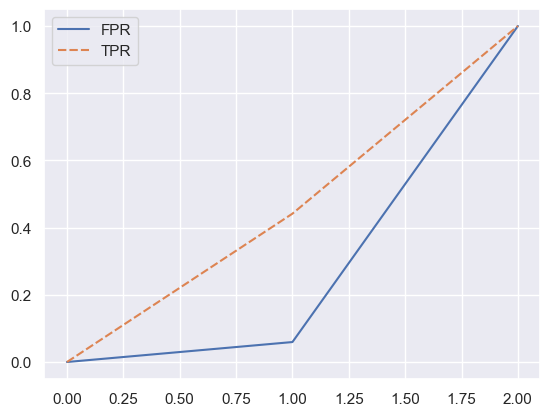

In [108]:
# Plot ROC Curve
import seaborn as sns
sns.lineplot([Cutoff_Table['FPR'],Cutoff_Table['TPR']])

In [109]:
# Area under curve (AUC)
auc(fpr, tpr)

0.6910576695723747

In [110]:
# Improve Model Output Using New Cutoff Point
############################

import numpy as np
Cutoff_Table['DiffBetweenTPRFPR'] = Cutoff_Table['TPR'] - Cutoff_Table['FPR'] # Max Diff. Bet. TPR & FPR

print(Cutoff_Table['DiffBetweenTPRFPR'])
Cutoff_Table['Distance'] = np.sqrt((1-Cutoff_Table['TPR'])**2 + (0-Cutoff_Table['FPR'])**2) 
# Euclidean Distance

0    0.000000
1    0.382115
2    0.000000
Name: DiffBetweenTPRFPR, dtype: float64


In [111]:
Cutoff_Table['DiffBetweenTPRFPR'].max()

# New Cutoff Point Performance (Obtained after studying ROC Curve and Cutoff Table)
# cutoffPoint = 0.3888115 # Max Difference between TPR & FPR

0.38211533914474954

In [112]:
# # Classify the test predictions into classes of 0s and 1s
# import numpy as np
# X_test['Test_Class2'] = np.where(X_test['Test_Prob'] >= cutoffPoint, 1, 0)

In [113]:
# # Confusion Matrix
# Confusion_Mat2 = pd.crosstab(X_test['Test_Class2'], y_test) # R, C format
# Confusion_Mat2

# KNN Classifier

In [114]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()

model2 = knn.fit(X_train, y_train)
prediction2 = model2.predict(X_test)


In [115]:
print("Acc on training data: {:,.3f}".format(knn.score(X_train, y_train)))
print("Acc on test data: {:,.3f}".format(knn.score(X_test, y_test)))

Acc on training data: 0.873
Acc on test data: 0.838


In [116]:
print(classification_report(y_test, prediction2))


              precision    recall  f1-score   support

           0       0.88      0.91      0.90      7409
           1       0.68      0.61      0.64      2309

    accuracy                           0.84      9718
   macro avg       0.78      0.76      0.77      9718
weighted avg       0.83      0.84      0.84      9718



# RANDOM FOREST


In [117]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()

model1 = rfc.fit(X_train, y_train)
prediction1 = model1.predict(X_test)

print("Acc on training data: {:,.3f}".format(rfc.score(X_train, y_train)))
print("Acc on test data: {:,.3f}".format(rfc.score(X_test, y_test)))

Acc on training data: 0.939
Acc on test data: 0.844


In [118]:
print(confusion_matrix(y_test, prediction1))


[[6815  594]
 [ 924 1385]]


In [119]:
print(classification_report(y_test, prediction1))


              precision    recall  f1-score   support

           0       0.88      0.92      0.90      7409
           1       0.70      0.60      0.65      2309

    accuracy                           0.84      9718
   macro avg       0.79      0.76      0.77      9718
weighted avg       0.84      0.84      0.84      9718



In [120]:
# Variable importance
model1.feature_importances_


array([0.24555574, 0.        , 0.03018684, 0.11503756, 0.08716366,
       0.        , 0.13241208, 0.01894557, 0.0154343 , 0.13593053,
       0.04837413, 0.14039658, 0.        , 0.03056302])

In [121]:
# precision= tp/tp+fp
print('Precision =',6811/(6811+912))


Precision = 0.8819111744140878


In [122]:
# recall= tp/tp+fn

print('Recall =', 6811  /(6811  +598))


Recall = 0.9192873532190579


In [123]:
#FOR OTHER CLASS 1(>50K)


In [124]:
print('Precision = ', 1397/(1397+598))


Precision =  0.700250626566416


In [125]:
print('Recall= ', 1397/(1397+912 ))


Recall=  0.6050238198354266


In [126]:
# RF

In [127]:
# RF Model with tuning parameters/ hyperparameter tuning
#################

In [128]:
M1_RF = RandomForestClassifier(random_state = 123, n_estimators = 25, 
                               max_features = 5, min_samples_leaf = 500)
M1_RF = M1_RF.fit(X_train, y_train)
Test_Pred1 = M1_RF.predict(X_test)

In [129]:
# Validation on Testset
print(classification_report(y_test, Test_Pred1)) # Actual, Predicted


              precision    recall  f1-score   support

           0       0.85      0.95      0.90      7409
           1       0.76      0.45      0.57      2309

    accuracy                           0.84      9718
   macro avg       0.80      0.70      0.73      9718
weighted avg       0.83      0.84      0.82      9718



In [130]:
# Confusion Matrix
Confusion_Mat = pd.crosstab(y_test, Test_Pred1) # R, C format (Actual = testY, Predicted = Test_Pred)
Confusion_Mat 


col_0,0,1
Income,,
0,7072,337
1,1262,1047


In [131]:
# Manual Grid Searching
#################

n_estimators_List = [25, 50, 75] # range(25,100,25)
max_features_List = [5, 7, 9] # range(5,11,2)
min_samples_leaf_List = [5, 10, 25, 50]

In [132]:
from sklearn.model_selection import GridSearchCV

my_param_grid = {'n_estimators': n_estimators_List, 
                 'max_features': max_features_List, 
                 'min_samples_leaf' : min_samples_leaf_List} 
                      

In [133]:
Grid_Search_Model = GridSearchCV(estimator = RandomForestClassifier(random_state=123), 
                     param_grid=my_param_grid,  
                     scoring='accuracy', 
                     cv=3).fit(X_train, y_train) # param_grid is a dictionary

In [134]:
Model_Validation_Df4 = pd.DataFrame.from_dict(Grid_Search_Model.cv_results_)
# Grid_Search_Model.cv_results_
Model_Validation_Df4

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_min_samples_leaf,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.402434,0.042644,0.042978,0.006682,5,5,25,"{'max_features': 5, 'min_samples_leaf': 5, 'n_...",0.852342,0.853400,0.852190,0.852644,0.000538,11
1,0.666950,0.022398,0.065957,0.000010,5,5,50,"{'max_features': 5, 'min_samples_leaf': 5, 'n_...",0.853533,0.853400,0.854440,0.853791,0.000462,3
2,1.013756,0.053507,0.109599,0.018620,5,5,75,"{'max_features': 5, 'min_samples_leaf': 5, 'n_...",0.854459,0.854194,0.854307,0.854320,0.000108,1
3,0.399104,0.036443,0.035654,0.005193,5,10,25,"{'max_features': 5, 'min_samples_leaf': 10, 'n...",0.852871,0.853665,0.850073,0.852203,0.001541,17
4,0.634294,0.039183,0.061979,0.000824,5,10,50,"{'max_features': 5, 'min_samples_leaf': 10, 'n...",0.852871,0.851019,0.850205,0.851365,0.001116,27
5,0.952453,0.046706,0.103601,0.008665,5,10,75,"{'max_features': 5, 'min_samples_leaf': 10, 'n...",0.853136,0.851945,0.851661,0.852247,0.000639,15
6,0.317151,0.040164,0.031316,0.001247,5,25,25,"{'max_features': 5, 'min_samples_leaf': 25, 'n...",0.852342,0.853268,0.849808,0.851806,0.001462,21
7,0.674266,0.032225,0.056648,0.001688,5,25,50,"{'max_features': 5, 'min_samples_leaf': 25, 'n...",0.852077,0.852739,0.849808,0.851541,0.001255,24
8,0.912142,0.086674,0.084619,0.000486,5,25,75,"{'max_features': 5, 'min_samples_leaf': 25, 'n...",0.851019,0.852342,0.851396,0.851586,0.000557,22
9,0.251182,0.006025,0.028650,0.001229,5,50,25,"{'max_features': 5, 'min_samples_leaf': 50, 'n...",0.848902,0.851813,0.847029,0.849248,0.001968,35


In [135]:
# Based on the selected hyperparamters, you should build a final model on the COMPLETE training data (trainX, trainY)
RF_Final = RandomForestClassifier(random_state = 123, n_estimators = 75, 
                               max_features = 9, min_samples_leaf = 5).fit(X_train, y_train)
Test_Pred = RF_Final.predict(X_test)
print("Acc on training data: {:,.3f}".format(RF_Final.score(X_train, y_train)))
print("Acc on test data: {:,.3f}".format(RF_Final.score(X_test, y_test)))

Acc on training data: 0.884
Acc on test data: 0.857


In [136]:
# Confusion Matrix
Confusion_Mat = pd.crosstab(y_test, Test_Pred) # R, C format (Actual = testY, Predicted = Test_Pred)
Confusion_Mat 

col_0,0,1
Income,,
0,6935,474
1,911,1398


In [137]:
# Validation on Testset
print(classification_report(y_test, Test_Pred)) # Actual, Predicted


              precision    recall  f1-score   support

           0       0.88      0.94      0.91      7409
           1       0.75      0.61      0.67      2309

    accuracy                           0.86      9718
   macro avg       0.82      0.77      0.79      9718
weighted avg       0.85      0.86      0.85      9718



# Key Findings

# XGBoost classifier

In [138]:
!pip3 install xgboost

In [139]:
from xgboost.sklearn import XGBClassifier

In [140]:
XGmodel = XGBClassifier(random_state=123)
XG=XGmodel.fit(X_train, y_train)

In [141]:
XGB = XG.predict(X_test)

In [142]:
print("Acc on training data: {:,.3f}".format(XGmodel.score(X_train, y_train)))
print("Acc on test data: {:,.3f}".format(XGmodel.score(X_test, y_test)))

Acc on training data: 0.884
Acc on test data: 0.864


In [143]:
# Validation on Testset
print(classification_report(y_test, XGB)) # Actual, Predicted


              precision    recall  f1-score   support

           0       0.89      0.94      0.91      7409
           1       0.75      0.64      0.69      2309

    accuracy                           0.86      9718
   macro avg       0.82      0.79      0.80      9718
weighted avg       0.86      0.86      0.86      9718



In [144]:
param_test1 = {
 'max_depth':range(3,10,2),
 'min_child_weight':range(1,6,2)
}
gsearch1 = GridSearchCV(estimator = XGBClassifier( learning_rate =0.1, n_estimators=140, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
 param_grid = param_test1, scoring='roc_auc',n_jobs=4, cv=5)
XG1=gsearch1.fit(X_train, y_train)
# scor=gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_

In [145]:
XG_Pred = XG1.predict(X_test)

In [146]:
print("Acc on training data: {:,.3f}".format(XG1.score(X_train, y_train)))
print("Acc on test data: {:,.3f}".format(XG1.score(X_test, y_test)))

Acc on training data: 0.932
Acc on test data: 0.923


In [147]:
# Validation on Testset
print(classification_report(y_test, XG_Pred)) # Actual, Predicted

              precision    recall  f1-score   support

           0       0.89      0.95      0.92      7409
           1       0.79      0.62      0.69      2309

    accuracy                           0.87      9718
   macro avg       0.84      0.78      0.80      9718
weighted avg       0.86      0.87      0.86      9718



In [148]:
# Creating Pickle file

In [149]:
# creating a pickle file - arndom forest after hyperparameter tuning
import pickle
pickle_out = open("Model.pickle","wb")
pickle.dump(Test_Pred, pickle_out)
pickle_out.close()